# Importing the necessary libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings as wr
wr.filterwarnings('ignore')

# Import the dataset

In [ ]:
df=pd.read_csv('cardio_train.csv',delimiter=';')
df.head()
df=df.drop(['id'],axis=1)
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,17474,1,156,56.0,100,60,1,1,0,0,0,0


## Understanding and displaying the data

In [ ]:
print('The information about the dataset is : \n',df.info(),'\n')
print('The uniqueness of the dataset is : \n',df.nunique(),'\n')
print('Checking if the datatype is numeric or object type, true when object : \n',df.dtypes=='object','\n')
print('Checking for the missing values : \n',df.isnull().sum(),'\n')
print('The basic statistics of the data, that is data description : \n',df.describe(),'\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          70000 non-null  int64  
 1   gender       70000 non-null  int64  
 2   height       70000 non-null  int64  
 3   weight       70000 non-null  float64
 4   ap_hi        70000 non-null  int64  
 5   ap_lo        70000 non-null  int64  
 6   cholesterol  70000 non-null  int64  
 7   gluc         70000 non-null  int64  
 8   smoke        70000 non-null  int64  
 9   alco         70000 non-null  int64  
 10  active       70000 non-null  int64  
 11  cardio       70000 non-null  int64  
dtypes: float64(1), int64(11)
memory usage: 6.4 MB
The information about the dataset is : 
 None 

The uniqueness of the dataset is : 
 age            8076
gender            2
height          109
weight          287
ap_hi           153
ap_lo           157
cholesterol       3
gluc              3
smoke  

In [ ]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

filtered_df = remove_outliers(df, 'ap_hi')
filtered_df = remove_outliers(filtered_df, 'ap_lo')
filtered_df.dropna()
print(filtered_df.head())
print(filtered_df.info())

     age  gender  height  weight  ap_hi  ap_lo  cholesterol  gluc  smoke  \
0  18393       2     168    62.0    110     80            1     1      0   
1  20228       1     156    85.0    140     90            3     1      0   
2  18857       1     165    64.0    130     70            3     1      0   
3  17623       2     169    82.0    150    100            1     1      0   
5  21914       1     151    67.0    120     80            2     2      0   

   alco  active  cardio  
0     0       1       0  
1     0       1       1  
2     0       0       1  
3     0       1       1  
5     0       0       0  
<class 'pandas.core.frame.DataFrame'>
Index: 64502 entries, 0 to 69999
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          64502 non-null  int64  
 1   gender       64502 non-null  int64  
 2   height       64502 non-null  int64  
 3   weight       64502 non-null  float64
 4   ap_hi        64502 non-nul

In [ ]:
print(filtered_df.isnull().sum())


age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64


# Exploratory Data Analysis
Includes univariate, bivariate and multivariate analysis as part of data preprocessing

## Univariate Analysis
### Univariate analysis is being done using box plot to detect the outliers

<Axes: >

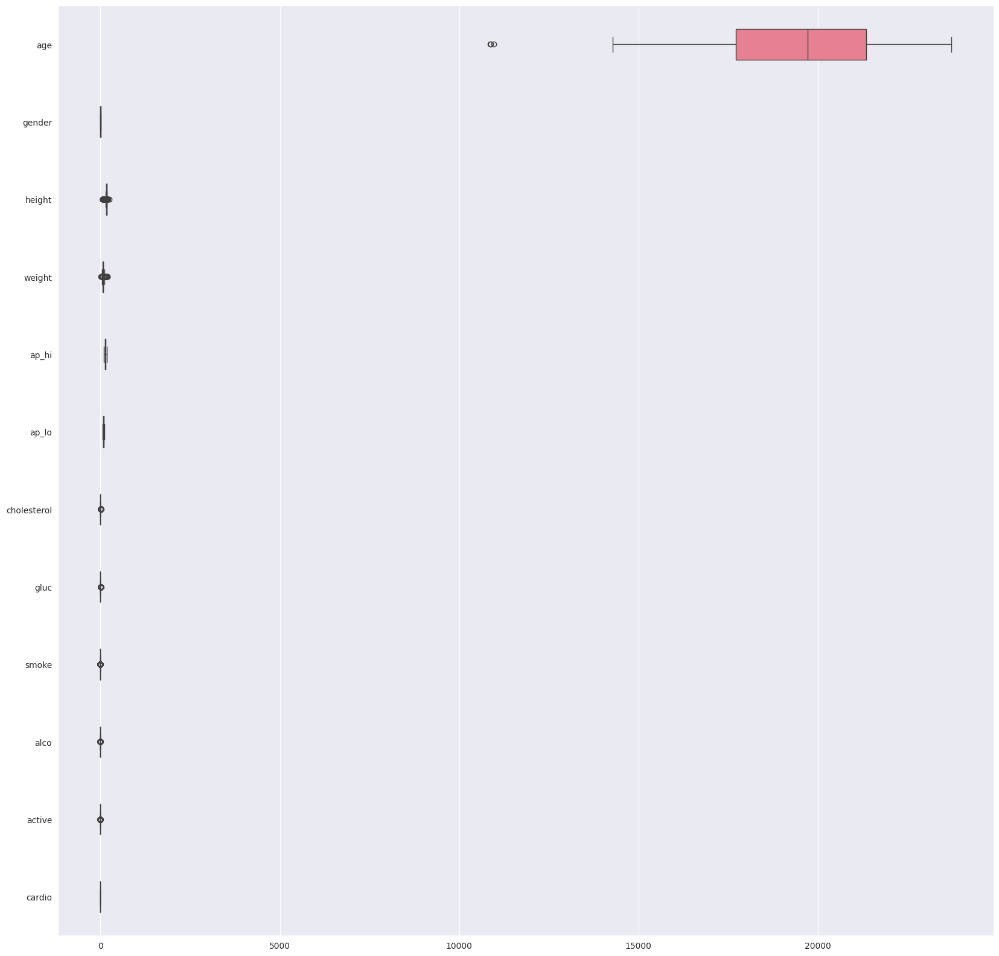

In [ ]:
plt.figure(figsize=(20,20))
sns.set_style('darkgrid')
sns.set_palette('pastel')
sns.boxplot(data=filtered_df,orient='h',width=0.4)

### Count plot to check the class balance in the target feature

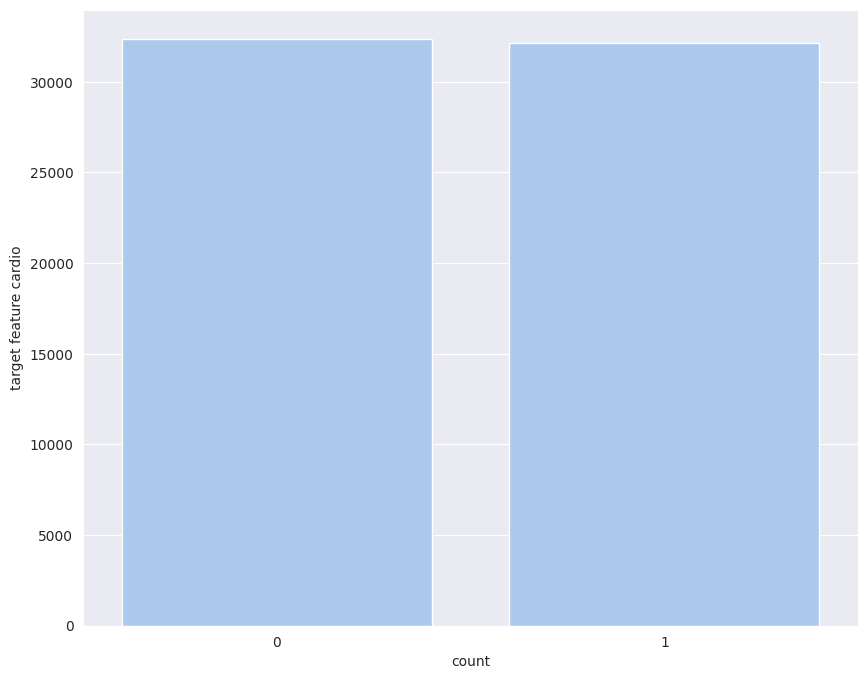

In [ ]:
plt.figure(figsize=(10,8))
sns.countplot(x='cardio',data=filtered_df)
plt.xlabel('count')
plt.ylabel('target feature cardio')
plt.show()

### Kernel Density plots for skewness and the data distribution

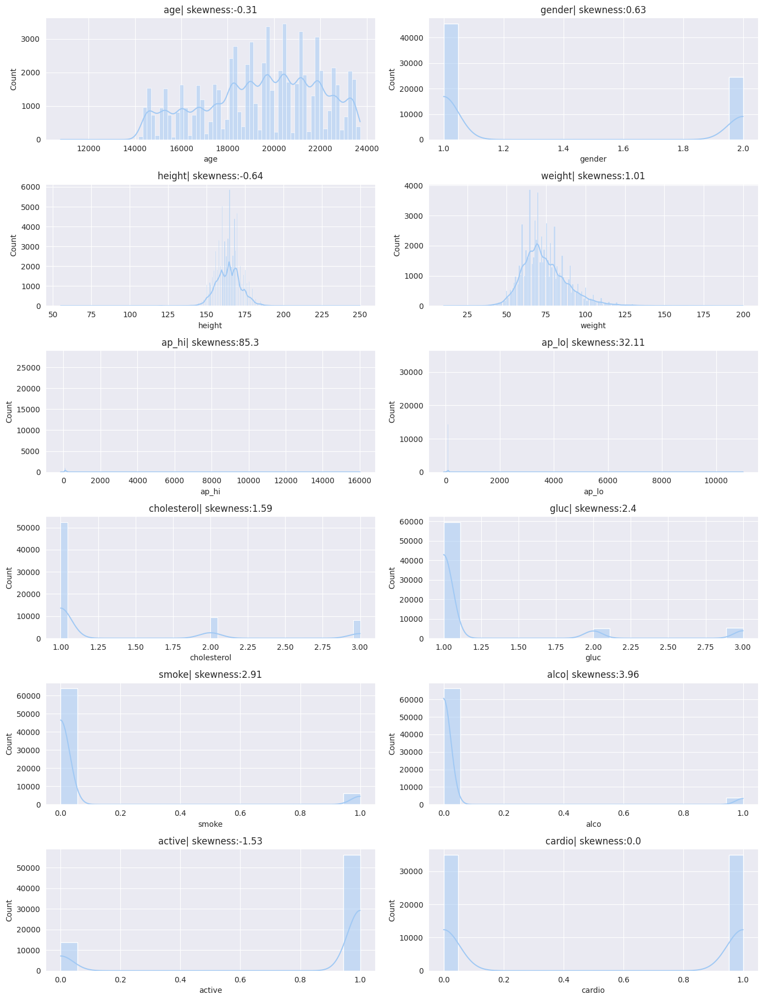

In [ ]:
sns.set_style('darkgrid')
numerical_columns=filtered_df.select_dtypes(include=['int64','float64']).columns
plt.figure(figsize=(14,len(numerical_columns)*3))
for idx, feature in enumerate(numerical_columns,1):
    plt.subplot(len(numerical_columns),2,idx)
    sns.histplot(df[feature],kde=True)
    plt.title(f"{feature}| skewness:{round(df[feature].skew(),2)}")

plt.tight_layout()
plt.show()

### bivariate analysis using pairplot

<Figure size 1000x800 with 0 Axes>

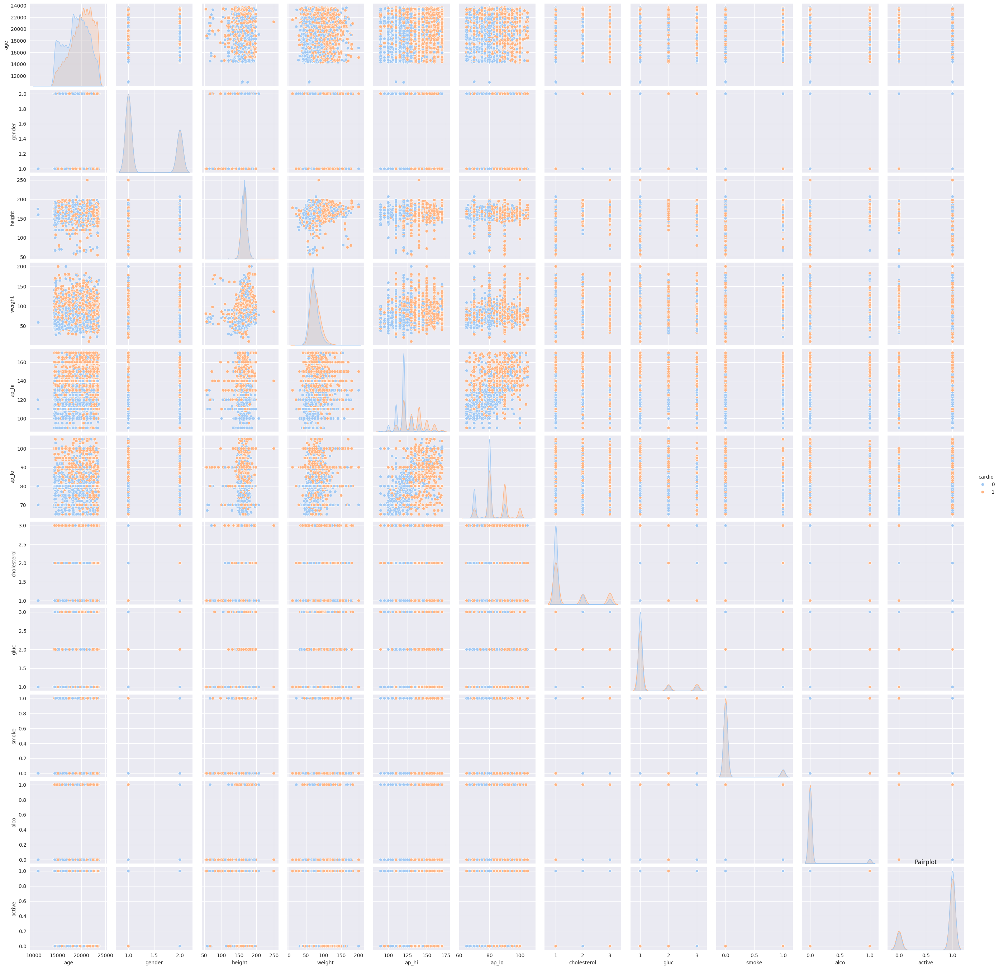

In [ ]:
plt.figure(figsize=(10,8))
sns.pairplot(filtered_df,hue='cardio')
plt.title('Pairplot')
plt.show()

### Multivariate analysis using coreelation matrix as heatmap

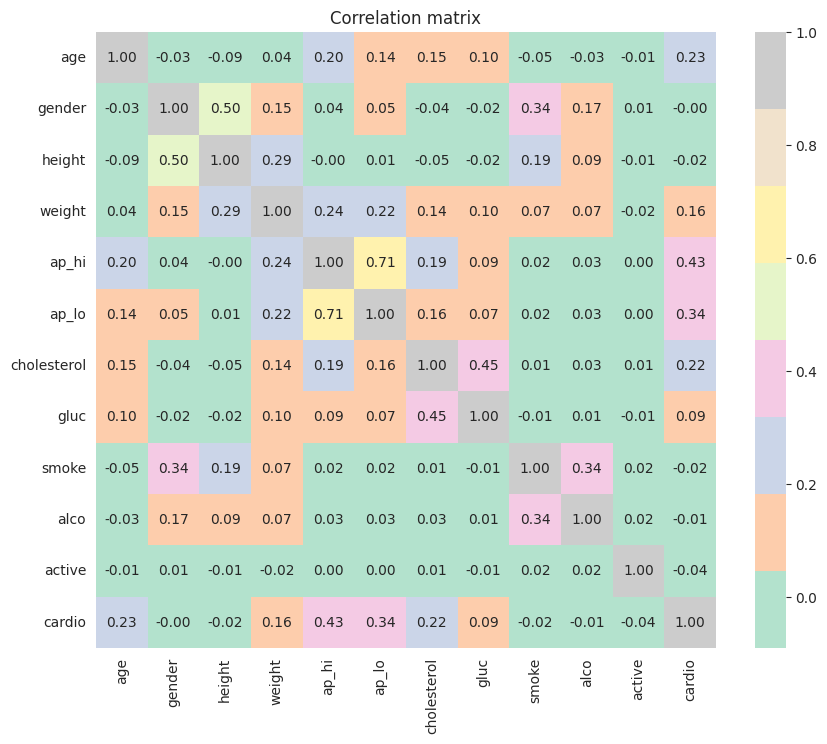

In [ ]:
plt.figure(figsize=(10,8))
matrix=filtered_df.corr()
sns.heatmap(matrix,annot=True,cmap='Pastel2',fmt='.2f',annot_kws={'size':10})
plt.title('Correlation matrix')
plt.show()

# Feature Scaling

In [ ]:
from sklearn.preprocessing import MinMaxScaler
sc=MinMaxScaler()
scaled=sc.fit_transform(filtered_df)
df_scaled=pd.DataFrame(scaled,columns=filtered_df.columns)
print(df_scaled)

            age  gender    height    weight   ap_hi  ap_lo  cholesterol  gluc  \
0      0.586121     1.0  0.579487  0.269841  0.2500  0.375          0.0   0.0   
1      0.728878     0.0  0.517949  0.391534  0.6250  0.625          1.0   0.0   
2      0.622219     0.0  0.564103  0.280423  0.5000  0.125          1.0   0.0   
3      0.526218     1.0  0.584615  0.375661  0.7500  0.875          0.0   0.0   
4      0.860044     0.0  0.492308  0.296296  0.3750  0.375          0.5   0.5   
...         ...     ...       ...       ...     ...    ...          ...   ...   
64497  0.794694     0.0  0.564103  0.365079  0.7500  0.375          0.0   0.0   
64498  0.652015     1.0  0.579487  0.343915  0.3750  0.375          0.0   0.0   
64499  0.913490     0.0  0.528205  0.608466  0.6250  0.625          0.5   0.5   
64500  0.900265     0.0  0.553846  0.322751  0.5625  0.375          0.0   0.5   
64501  0.753151     0.0  0.589744  0.322751  0.3750  0.375          0.5   0.0   

       smoke  alco  active 

## Splitting the data and extracting the target features

In [ ]:
x=df_scaled.iloc[:,:-1]
y=df_scaled.iloc[:,-1]

# Feature Transformation

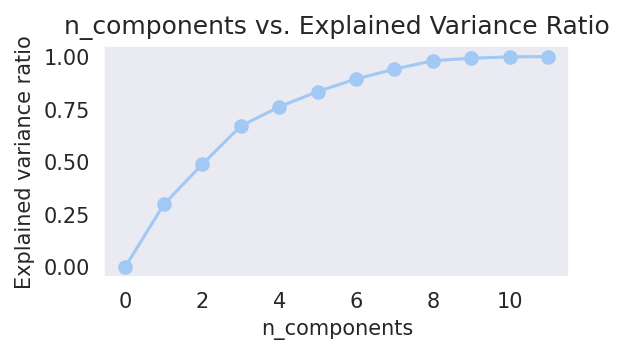

In [ ]:
from sklearn.decomposition import PCA
nums = np.arange(12)
var_ratio = []
for num in nums:
  pca = PCA(n_components=num)
  pca.fit(x)
  var_ratio.append(np.sum(pca.explained_variance_ratio_))

plt.figure(figsize=(4,2),dpi=150)
plt.grid()
plt.plot(nums,var_ratio,marker='o')
plt.xlabel('n_components')
plt.ylabel('Explained variance ratio')
plt.title('n_components vs. Explained Variance Ratio')
plt.show()

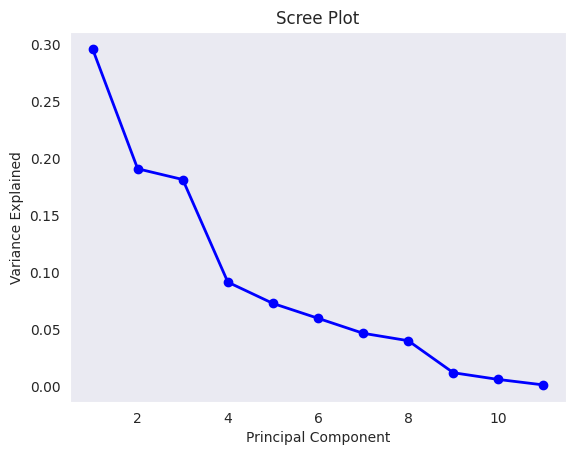

In [ ]:
PC_values = np.arange(pca.n_components_) + 1
plt.grid()
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

The optimal number of principal components will be 8 or 9.

In [ ]:
pca=PCA(n_components=9)
x_pca=pca.fit_transform(x)
print(sum(pca.explained_variance_ratio_))

0.9923584836379057


## Splitting the data into training and testing data

In [ ]:
from sklearn.model_selection import train_test_split
x_train_pca,x_test_pca,y_train_pca,y_test_pca=train_test_split(x_pca,y,test_size=0.30,random_state=10)

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=10)
print(x_train.head())

            age  gender    height    weight  ap_hi  ap_lo  cholesterol  gluc  \
28602  0.388362     0.0  0.558974  0.264550  0.500  0.375          0.0   0.5   
60279  0.391940     0.0  0.558974  0.291005  0.500  0.625          0.0   0.0   
44837  0.785047     1.0  0.584615  0.354497  0.375  0.125          1.0   1.0   
20473  0.681889     1.0  0.574359  0.275132  0.375  0.375          1.0   1.0   
42292  0.761397     1.0  0.538462  0.259259  0.375  0.375          0.0   0.0   

       smoke  alco  active  
28602    0.0   0.0     1.0  
60279    0.0   0.0     1.0  
44837    0.0   0.0     0.0  
20473    0.0   0.0     1.0  
42292    0.0   0.0     1.0  


# Model selection and fitting the model

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

#### Decision Tree Classifier

In [ ]:
dt=DecisionTreeClassifier(criterion='gini',random_state=42)
model1=dt.fit(x_train,y_train)
y_pred1_tr=model1.predict(x_train)
acc1_tr=accuracy_score(y_train,y_pred1_tr)*100
print(acc1_tr)
y_pred1=model1.predict(x_test)
acc1=accuracy_score(y_test,y_pred1)*100
print(acc1)

99.98643437142691
62.204480272847064


In [ ]:
cm1=confusion_matrix(y_test,y_pred1)
print(cm1)

[[4031 2438]
 [2438 3994]]


In [ ]:
rep1=classification_report(y_test,y_pred1)
print(rep1)

              precision    recall  f1-score   support

         0.0       0.62      0.62      0.62      6469
         1.0       0.62      0.62      0.62      6432

    accuracy                           0.62     12901
   macro avg       0.62      0.62      0.62     12901
weighted avg       0.62      0.62      0.62     12901



In [ ]:
svm=SVC(kernel='linear',C=1.0,gamma=0.5)
model2=svm.fit(x_train,y_train)
y_pred2_tr=model2.predict(x_train)
acc2_tr=accuracy_score(y_train,y_pred2_tr)*100
print(acc2_tr)
y_pred2=model2.predict(x_test)
acc2=accuracy_score(y_test,y_pred2)*100
print(acc2)

72.33386949865313
71.23478800093017


In [ ]:
cm2=confusion_matrix(y_test,y_pred2)
print(cm2)

[[5181 1288]
 [2423 4009]]


In [ ]:
rep3=classification_report(y_test,y_pred2)
print(rep3)

              precision    recall  f1-score   support

         0.0       0.68      0.80      0.74      6469
         1.0       0.76      0.62      0.68      6432

    accuracy                           0.71     12901
   macro avg       0.72      0.71      0.71     12901
weighted avg       0.72      0.71      0.71     12901



In [ ]:
rf=RandomForestClassifier(n_estimators=100)
model3=rf.fit(x_train,y_train)
y_pred3_tr=model3.predict(x_train)
acc3_tr=accuracy_score(y_train,y_pred3_tr)*100
print(acc3_tr)
y_pred3=model3.predict(x_test)
acc3=accuracy_score(y_test,y_pred3)*100
print(acc3)

99.9844964244879
69.90155801875824


In [ ]:
cm3=confusion_matrix(y_test,y_pred3)
print(cm3)

[[4666 1803]
 [2080 4352]]


In [ ]:
rep3=classification_report(y_test,y_pred3)
print(rep3)

              precision    recall  f1-score   support

         0.0       0.69      0.72      0.71      6469
         1.0       0.71      0.68      0.69      6432

    accuracy                           0.70     12901
   macro avg       0.70      0.70      0.70     12901
weighted avg       0.70      0.70      0.70     12901



In [ ]:
logr=LogisticRegression(penalty='l2',C=1.0)
model4=logr.fit(x_train,y_train)
y_pred4_tr=model4.predict(x_train)
acc4_tr=accuracy_score(y_train,y_pred4_tr)*100
print(acc4_tr)
y_pred4=model4.predict(x_test)
acc4=accuracy_score(y_test,y_pred4)*100
print(acc4)

72.52766419255441
71.47507945120533


In [ ]:
cm4=confusion_matrix(y_test,y_pred4)
print(cm4)

[[4981 1488]
 [2192 4240]]


In [ ]:
rep4=classification_report(y_test,y_pred4)
print(rep4)

              precision    recall  f1-score   support

         0.0       0.69      0.77      0.73      6469
         1.0       0.74      0.66      0.70      6432

    accuracy                           0.71     12901
   macro avg       0.72      0.71      0.71     12901
weighted avg       0.72      0.71      0.71     12901



In [ ]:
adb=AdaBoostClassifier(n_estimators=100,learning_rate=1)
model5=adb.fit(x_train,y_train)
y_pred5_tr=model1.predict(x_train)
acc5_tr=accuracy_score(y_train,y_pred5_tr)*100
print(acc5_tr)
y_pred5=model5.predict(x_test)
acc5=accuracy_score(y_test,y_pred5)*100
print(acc5)

99.98643437142691
71.92465700333307


In [ ]:
cm5=confusion_matrix(y_test,y_pred5)
print(cm5)

[[5102 1367]
 [2255 4177]]


In [ ]:
rep5=classification_report(y_test,y_pred5)
print(rep5)

              precision    recall  f1-score   support

         0.0       0.69      0.79      0.74      6469
         1.0       0.75      0.65      0.70      6432

    accuracy                           0.72     12901
   macro avg       0.72      0.72      0.72     12901
weighted avg       0.72      0.72      0.72     12901



In [ ]:
hgb=HistGradientBoostingClassifier(learning_rate=0.1)
model6=hgb.fit(x_train,y_train)
y_pred6_tr=model6.predict(x_train)
acc6_tr=accuracy_score(y_train,y_pred6_tr)*100
print(acc6_tr)
y_pred6=model6.predict(x_test)
acc6=accuracy_score(y_test,y_pred6)*100
print(acc6)

74.15747756826418
72.13394310518565


In [ ]:
cm6=confusion_matrix(y_test,y_pred6)
print(cm6)

[[4942 1527]
 [2068 4364]]


In [ ]:
rep6=classification_report(y_test,y_pred6)
print(rep6)

              precision    recall  f1-score   support

         0.0       0.70      0.76      0.73      6469
         1.0       0.74      0.68      0.71      6432

    accuracy                           0.72     12901
   macro avg       0.72      0.72      0.72     12901
weighted avg       0.72      0.72      0.72     12901



In [ ]:
dt_pca=DecisionTreeClassifier(criterion='gini',random_state=42)
model1_pca=dt_pca.fit(x_train_pca,y_train_pca)
y_pred1_tr_pca=model1_pca.predict(x_train_pca)
acc1_tr_pca=accuracy_score(y_train_pca,y_pred1_tr_pca)*100
print(acc1_tr_pca)
y_pred1_pca=model1_pca.predict(x_test_pca)
acc1_pca=accuracy_score(y_test_pca,y_pred1_pca)*100
print(acc1_pca)

99.99114083851963
62.5342359567981


In [ ]:
cm1_pca=confusion_matrix(y_test_pca,y_pred1_pca)
print(cm1_pca)

[[6116 3654]
 [3596 5985]]


In [ ]:
rep1_pca=classification_report(y_test_pca,y_pred1_pca)
print(rep1_pca)

              precision    recall  f1-score   support

         0.0       0.63      0.63      0.63      9770
         1.0       0.62      0.62      0.62      9581

    accuracy                           0.63     19351
   macro avg       0.63      0.63      0.63     19351
weighted avg       0.63      0.63      0.63     19351



In [ ]:
svm_pca=SVC(kernel='linear',C=1.0,gamma=0.5)
model2_pca=svm_pca.fit(x_train_pca,y_train_pca)
y_pred2_tr_pca=model2_pca.predict(x_train_pca)
acc2_tr_pca=accuracy_score(y_train_pca,y_pred2_tr_pca)*100
print(acc2_tr_pca)
y_pred2_pca=model2_pca.predict(x_test_pca)
acc2_pca=accuracy_score(y_test_pca,y_pred2_pca)*100
print(acc2_pca)

72.13793714424929
72.01178233683014


In [ ]:
cm2_pca=confusion_matrix(y_test_pca,y_pred2_pca)
print(cm2_pca)

[[7940 1830]
 [3586 5995]]


In [ ]:
rep2_pca=classification_report(y_test_pca,y_pred2_pca)
print(rep2_pca)

              precision    recall  f1-score   support

         0.0       0.69      0.81      0.75      9770
         1.0       0.77      0.63      0.69      9581

    accuracy                           0.72     19351
   macro avg       0.73      0.72      0.72     19351
weighted avg       0.73      0.72      0.72     19351



In [ ]:
rf_pca=RandomForestClassifier(n_estimators=100)
model3_pca=rf_pca.fit(x_train_pca,y_train_pca)
y_pred3_tr_pca=model3_pca.predict(x_train_pca)
acc3_tr_pca=accuracy_score(y_train_pca,y_pred3_tr_pca)*100
print(acc3_tr_pca)
y_pred3_pca=model3_pca.predict(x_test_pca)
acc3_pca=accuracy_score(y_test_pca,y_pred3_pca)*100
print(acc3_pca)

99.98671125777945
68.80781354968735


In [ ]:
cm3_pca=confusion_matrix(y_test_pca,y_pred3_pca)
print(cm3_pca)

[[6891 2879]
 [3157 6424]]


In [ ]:
rep3_pca=classification_report(y_test_pca,y_pred3_pca)
print(rep3_pca)

              precision    recall  f1-score   support

         0.0       0.69      0.71      0.70      9770
         1.0       0.69      0.67      0.68      9581

    accuracy                           0.69     19351
   macro avg       0.69      0.69      0.69     19351
weighted avg       0.69      0.69      0.69     19351



In [ ]:
logr_pca=LogisticRegression(penalty='l2',C=1.0)
model4_pca=logr_pca.fit(x_train_pca,y_train_pca)
y_pred4_tr_pca=model4_pca.predict(x_train_pca)
acc4_tr_pca=accuracy_score(y_train_pca,y_pred4_tr_pca)*100
print(acc4_tr_pca)
y_pred4_pca=model4_pca.predict(x_test_pca)
acc4_pca=accuracy_score(y_test_pca,y_pred4_pca)*100
print(acc4_pca)

72.32176474496688
71.96527311250065


In [ ]:
cm4_pca=confusion_matrix(y_test_pca,y_pred4_pca)
print(cm4_pca)

[[7616 2154]
 [3271 6310]]


In [ ]:
rep4_pca=classification_report(y_test_pca,y_pred4_pca)
print(rep4_pca)

              precision    recall  f1-score   support

         0.0       0.70      0.78      0.74      9770
         1.0       0.75      0.66      0.70      9581

    accuracy                           0.72     19351
   macro avg       0.72      0.72      0.72     19351
weighted avg       0.72      0.72      0.72     19351



In [ ]:
adb_pca=AdaBoostClassifier(n_estimators=100,learning_rate=1)
model5_pca=adb_pca.fit(x_train_pca,y_train_pca)
y_pred5_tr_pca=model5_pca.predict(x_train_pca)
acc5_tr_pca=accuracy_score(y_train_pca,y_pred5_tr_pca)*100
print(acc5_tr_pca)
y_pred5_pca=model5_pca.predict(x_test_pca)
acc5_pca=accuracy_score(y_test_pca,y_pred5_pca)*100
print(acc5_pca)

72.85109964341875
72.29083768280708


In [ ]:
cm5_pca=confusion_matrix(y_test_pca,y_pred5_pca)
print(cm5_pca)

[[7520 2250]
 [3112 6469]]


In [ ]:
rep5_pca=classification_report(y_test_pca,y_pred5_pca)
print(rep5_pca)

              precision    recall  f1-score   support

         0.0       0.71      0.77      0.74      9770
         1.0       0.74      0.68      0.71      9581

    accuracy                           0.72     19351
   macro avg       0.72      0.72      0.72     19351
weighted avg       0.72      0.72      0.72     19351



In [ ]:
hgb_pca=HistGradientBoostingClassifier(learning_rate=0.1)
model6_pca=hgb_pca.fit(x_train_pca,y_train_pca)
y_pred6_tr_pca=model6_pca.predict(x_train_pca)
acc6_tr_pca=accuracy_score(y_train_pca,y_pred6_tr_pca)*100
print(acc6_tr_pca)
y_pred6_pca=model6_pca.predict(x_test_pca)
acc6_pca=accuracy_score(y_test_pca,y_pred6_pca)*100
print(acc6_pca)

73.9828575225355
72.63190532789004


In [ ]:
cm6_pca=confusion_matrix(y_test_pca,y_pred6_pca)
print(cm6_pca)

[[7539 2231]
 [3065 6516]]


In [ ]:
rep6_pca=classification_report(y_test_pca,y_pred6_pca)
print(rep6_pca)

              precision    recall  f1-score   support

         0.0       0.71      0.77      0.74      9770
         1.0       0.74      0.68      0.71      9581

    accuracy                           0.73     19351
   macro avg       0.73      0.73      0.73     19351
weighted avg       0.73      0.73      0.73     19351



Feature importance based on mean decrease in impurity in Random Forest

In [ ]:
features=list(df.columns)
feature_names = [f"feature {i}" for i in range(x.shape[1])]
import time
start_time=time.time()
importances=rf.feature_importances_
std=np.std([tree.feature_importances_ for tree in rf.estimators_],axis=0)
elasped_time=time.time()-start_time
print(f'Elasped time to compute the importances : {elasped_time: .3f} seconds')

Elasped time to compute the importances :  0.075 seconds


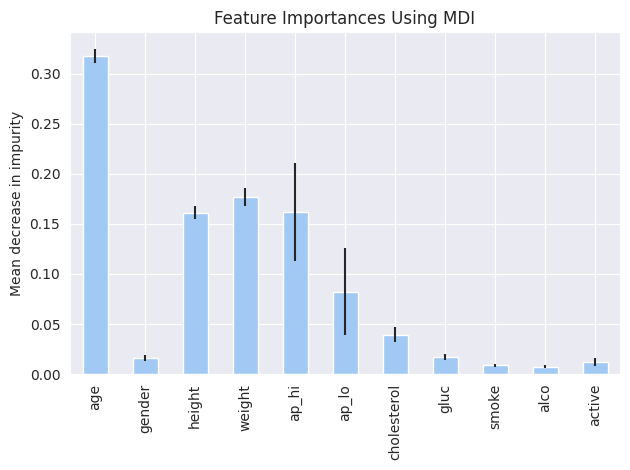

In [ ]:
forest_importances=pd.Series(importances,index=x.columns)
fig,ax=plt.subplots()
forest_importances.plot.bar(yerr=std,ax=ax)
ax.set_title("Feature Importances Using MDI")
ax.set_ylabel('Mean decrease in impurity')
fig.tight_layout()
plt.show()

In [ ]:
forest_importances

age            0.317964
gender         0.015711
height         0.161024
weight         0.176825
ap_hi          0.161875
ap_lo          0.082450
cholesterol    0.039160
gluc           0.016952
smoke          0.008574
alco           0.007287
active         0.012179
dtype: float64

In [ ]:
%pip install tensorflow keras

In [ ]:
import tensorflow as tf
import keras
from keras import Sequential
from keras.layers import Dense

model=Sequential()
model.add(Dense(10,input_dim=11,activation='softmax',kernel_initializer='uniform'))
model.add(Dense(10,activation='softmax',kernel_initializer='uniform'))
model.add(Dense(8,activation='softmax',kernel_initializer='uniform'))
model.add(Dense(1,activation='sigmoid',kernel_initializer='uniform'))
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model.summary()

log_dir = "logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

predictor=model.fit(x_train,y_train,epochs=100,batch_size=10,verbose=True,validation_split=0.20,callbacks=[tensorboard_callback])


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                120       
                                                                 
 dense_1 (Dense)             (None, 10)                110       
                                                                 
 dense_2 (Dense)             (None, 8)                 88        
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 327 (1.28 KB)
Trainable params: 327 (1.28 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/100
4128/4128 [==============================] - 20s 4ms/step - loss: 0.6768 - accuracy: 0.5733 - val_loss: 0.5985 - val_accuracy: 0.7104
Epoch 2/100


In [ ]:
%load_ext tensorboard
%tensorboard --logdir $log_dir

<IPython.core.display.Javascript object>

In [ ]:
model.save('my_model.h5')

# SHAP

In [ ]:
%pip install shap
import shap
shap.initjs()
x_train_new=x_train.to_numpy()
x_test_new=x_test.to_numpy()
masker = shap.maskers.Independent(x_train_new)
explainer = shap.Explainer(model,masker)
shap_values = explainer.shap_values(x_test_new)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 3.6 MB/s eta 0:00:00


PermutationExplainer explainer: 12902it [05:57, 35.54it/s]                           


In [ ]:
explanation = shap.Explanation(values=shap_values)

In [ ]:
shap_values_test=shap_values.reshape(-1)

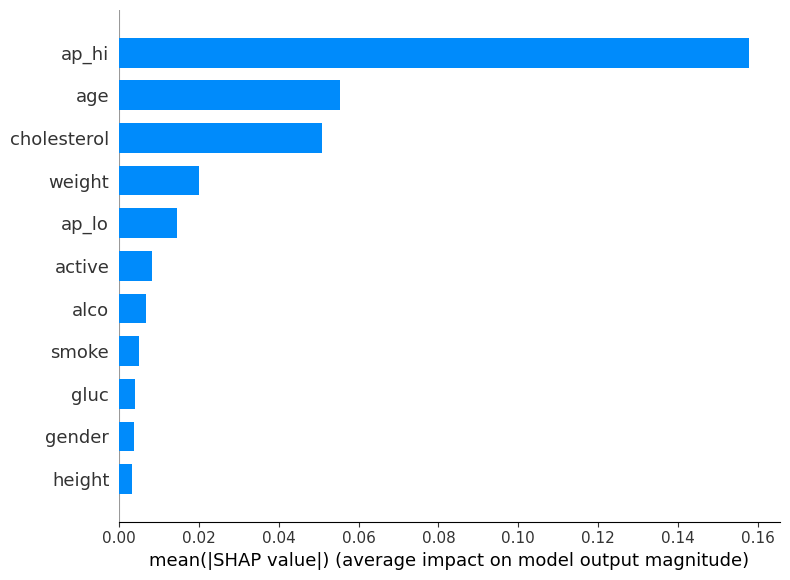

In [ ]:
shap.summary_plot(shap_values,x_test,feature_names=x_test.columns,plot_type='bar')

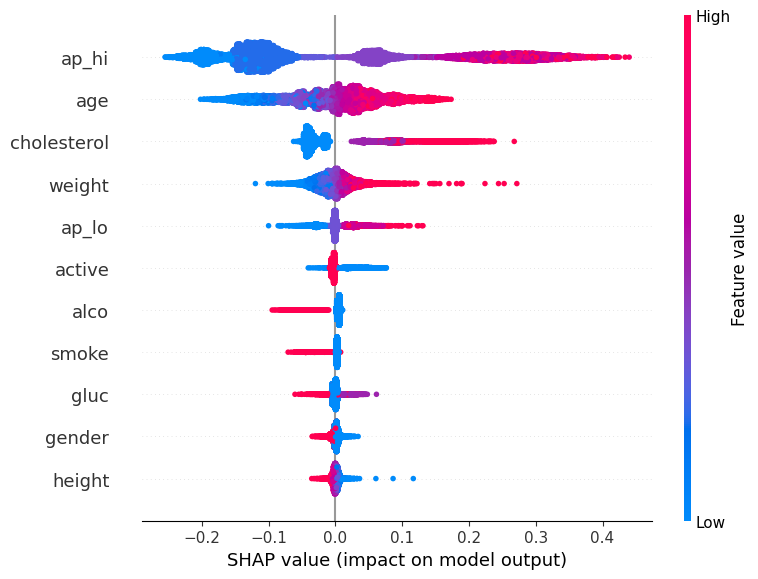

In [ ]:
shap.summary_plot(shap_values,x_test,feature_names=x_test.columns)

### DICE (Diverse Counterfactual Explanations)

In [ ]:
%pip install dice-ml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 38.5 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.0.3
    Uninstalling pandas-2.0.3:
      Successfully uninstalled pandas-2.0.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pandas<2.2.2dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
google-colab 1.0.0 requires pandas==2.0.3, but you have pandas 1.5.3 which is incompatible.


In [ ]:
import dice_ml
from dice_ml.utils import helpers

# Load a trained Keras model
backend = 'TF2'
loaded_model = tf.keras.models.load_model('my_model.h5')

# Create a DataFrame from training data
data_df = pd.DataFrame(x_train, columns=x.columns)
data_df['cardio'] = y_train

# Initialize DiCE
d = dice_ml.Data(dataframe=data_df, continuous_features=['age','height','weight','ap_hi','ap_lo'], outcome_name='cardio')
m = dice_ml.Model(model=loaded_model, backend=backend)
exp = dice_ml.Dice(d, m)

# Generate counterfactual explanations
query_instance = pd.DataFrame([x_test.iloc[0]], columns=x.columns)

query_instance = query_instance.reset_index(drop=True)

counterfactuals = exp.generate_counterfactuals(query_instance, total_CFs=5, desired_class="opposite")
counterfactuals.visualize_as_dataframe(show_only_changes=True)


100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

Query instance (original outcome : 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.688657,0.0,0.517949,0.306878,0.25,0.25,0.5,0.0,0.0,0.0,1.0,0



Diverse Counterfactual set (new outcome: 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,-,-,-,-,-,0.948,-,-,-,-,-,1.0
1,-,-,-,-,0.726,-,0.0,-,-,-,-,1.0
2,-,-,-,-,0.749,-,-,-,-,-,-,1.0
3,-,-,-,-,0.384,-,-,-,-,-,-,1.0
4,0.8248965,-,-,-,-,-,-,1.0,-,-,-,1.0


In [ ]:
# Generate counterfactual explanations
query_instance = pd.DataFrame(x_test[0:10], columns=x.columns)

query_instance = query_instance.reset_index(drop=True)

counterfactuals = exp.generate_counterfactuals(query_instance, total_CFs=5, desired_class="opposite")
counterfactuals.visualize_as_dataframe(show_only_changes=True)

100%|██████████| 10/10 [00:15<00:00,  1.54s/it]

Query instance (original outcome : 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.688657,0.0,0.517949,0.306878,0.25,0.25,0.5,0.0,0.0,0.0,1.0,0



Diverse Counterfactual set (new outcome: 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,-,-,-,-,-,0.517,1.0,-,-,-,-,1.0
1,-,-,-,0.8049754,-,-,-,-,-,-,-,1.0
2,0.3411223,-,-,0.9100135,-,-,-,-,-,-,-,1.0
3,0.6208122,-,-,-,0.519,-,-,-,-,-,-,1.0
4,-,-,-,-,0.628,-,-,-,-,-,-,1.0


Query instance (original outcome : 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.58511,0.0,0.497436,0.201058,0.375,0.375,0.0,0.0,0.0,0.0,1.0,0



Diverse Counterfactual set (new outcome: 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,-,-,-,-,0.846,-,-,-,-,-,-,1.0
1,-,-,-,0.8289533,-,-,-,-,-,-,-,1.0
2,-,-,-,0.7425571,-,-,-,-,-,-,-,1.0
3,-,-,-,0.431615,0.63,-,-,-,-,-,-,1.0
4,0.9434876,-,-,-,-,0.734,-,-,-,-,-,1.0


Query instance (original outcome : 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.81321,0.0,0.528205,0.391534,0.5,0.375,1.0,0.0,0.0,0.0,1.0,1



Diverse Counterfactual set (new outcome: 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.188851,-,-,-,0.262,-,-,-,-,-,-,0.0
1,0.1996118,-,-,-,0.31,-,-,-,-,-,-,0.0
2,0.1136808,-,-,-,0.166,-,-,-,-,-,-,0.0
3,0.3150917,-,-,-,-,-,0.0,-,-,-,-,0.0
4,0.0456717,-,-,-,0.006,-,-,-,-,-,-,0.0


Query instance (original outcome : 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.440952,0.0,0.512821,0.275132,0.5,0.625,0.5,0.0,0.0,0.0,1.0,1



Diverse Counterfactual set (new outcome: 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,-,-,-,-,0.195,-,-,-,-,-,-,0.0
1,-,-,-,-,0.168,-,-,0.5,-,-,-,0.0
2,-,-,-,-,0.277,0.845,-,-,-,-,-,0.0
3,-,-,-,-,0.331,-,-,-,-,-,-,0.0
4,-,-,-,-,0.381,-,-,-,-,-,-,0.0


Query instance (original outcome : 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.805197,0.0,0.512821,0.444444,0.5,0.625,0.0,0.0,0.0,0.0,1.0,1



Diverse Counterfactual set (new outcome: 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.037514,-,-,-,-,-,-,-,-,1.0,-,0.0
1,-,-,0.7778649,-,0.024,-,-,-,-,-,-,0.0
2,-,-,-,-,0.059,-,-,-,-,-,-,0.0
3,-,-,-,-,0.074,-,-,-,-,-,-,0.0
4,-,-,-,0.1056269,0.4,-,-,-,-,-,-,0.0


Query instance (original outcome : 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.791738,0.0,0.507692,0.31746,0.5,0.375,1.0,1.0,0.0,0.0,0.0,1



Diverse Counterfactual set (new outcome: 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.0244473,-,-,-,-,-,0.0,-,-,-,-,0.0
1,0.3164134,1.0,-,-,-,-,-,-,-,-,-,0.0
2,0.2515621,-,-,-,0.039,-,-,-,-,-,-,0.0
3,0.1522154,1.0,-,-,-,-,-,-,-,-,-,0.0
4,0.0763825,-,-,-,0.418,-,-,-,-,-,-,0.0


Query instance (original outcome : 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.915046,0.0,0.528205,0.253968,0.25,0.375,0.0,0.0,0.0,0.0,1.0,0



Diverse Counterfactual set (new outcome: 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,-,-,-,0.4727448,-,-,-,-,-,-,-,1.0
1,-,-,-,0.5828742,-,-,-,-,-,-,-,1.0
2,-,-,-,0.4202296,-,-,-,0.5,-,-,-,1.0
3,-,-,-,0.4826929,-,-,-,-,-,-,-,1.0
4,-,-,-,0.373291,-,-,-,-,-,-,-,1.0


Query instance (original outcome : 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.801929,0.0,0.528205,0.248677,0.3125,0.25,0.0,0.0,0.0,0.0,1.0,0



Diverse Counterfactual set (new outcome: 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,-,-,-,-,0.613,-,-,-,-,-,-,1.0
1,-,-,-,-,-,0.719,-,-,-,-,0.0,1.0
2,-,-,-,-,0.505,-,-,-,-,-,-,1.0
3,-,-,-,-,-,-,1.0,-,-,-,-,1.0
4,-,-,-,0.7311684,-,-,-,-,-,-,-,1.0


Query instance (original outcome : 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.855531,0.0,0.574359,0.407407,0.375,0.375,0.0,1.0,0.0,0.0,1.0,1



Diverse Counterfactual set (new outcome: 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,-,-,-,0.3550868,-,-,-,-,-,-,-,0.0
1,0.5601263,-,-,-,-,-,-,-,-,-,-,0.0
2,0.7967639,-,-,-,-,-,-,-,-,1.0,-,0.0
3,0.6777259,-,-,-,-,0.76,-,-,-,-,-,0.0
4,-,1.0,-,0.3699463,-,-,-,-,-,-,-,0.0


Query instance (original outcome : 1)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.956512,1.0,0.620513,0.365079,0.375,0.375,0.0,0.0,0.0,0.0,1.0,1



Diverse Counterfactual set (new outcome: 0)


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.6494309,-,-,-,-,-,-,-,-,-,-,0.0
1,0.8245147,-,-,-,0.302,-,-,-,-,-,-,0.0
2,0.8648868,-,-,-,-,-,-,-,-,-,-,0.0
3,0.2720489,-,-,-,-,-,-,-,-,-,-,0.0
4,0.2396032,-,-,-,-,-,-,-,-,-,-,0.0


In [ ]:
query_instances=x_test[0:100]
imp=exp.global_feature_importance(query_instances,total_CFs=10)
f=pd.DataFrame(imp.summary_importance,index=[0])
print(f)

100%|██████████| 100/100 [12:27<00:00,  7.48s/it]


   ap_hi    age  weight  cholesterol  ap_lo  height   gluc  active   alco  \
0  0.595  0.243   0.216        0.132  0.107   0.087  0.059   0.044  0.042   

   smoke  gender  
0  0.039   0.035  


In [46]:
f

,ap_hi,age,weight,cholesterol,ap_lo,height,gluc,active,alco,smoke,gender
0,0.595,0.243,0.216,0.132,0.107,0.087,0.059,0.044,0.042,0.039,0.035


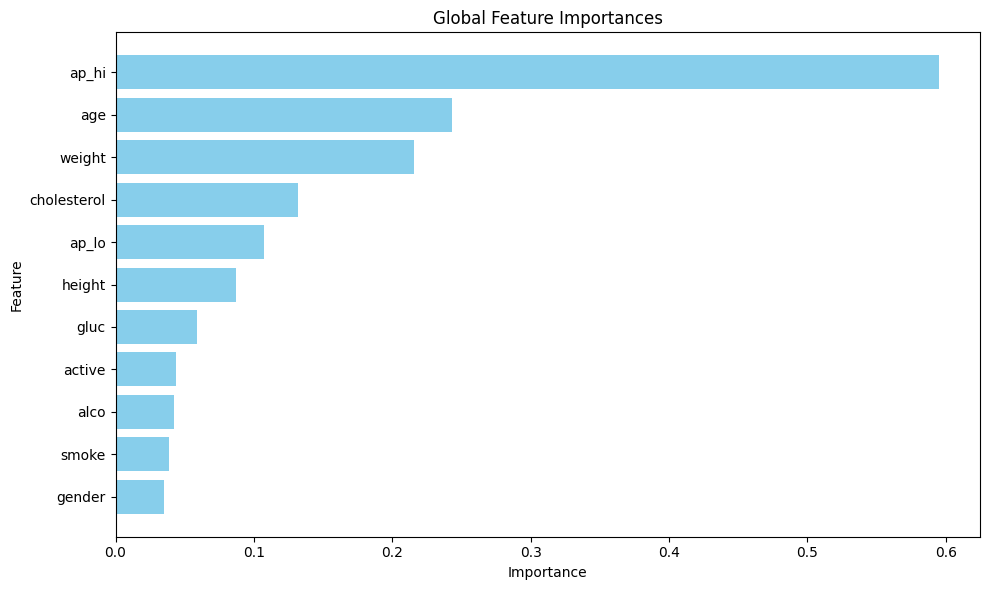

In [57]:
feature_names = f.columns
importances = f.values.flatten()

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.barh(feature_names, importances, color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Global Feature Importances')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.tight_layout()
plt.show()